# Linear Regression 

## import library

In [45]:
import numpy as np
import matplotlib.image as img
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from mpl_toolkits.mplot3d import Axes3D

## load point data for training and testing

In [46]:
fname_data  = 'assignment_07_data.csv'

data        = np.genfromtxt(fname_data, delimiter=',')
num_data    = data.shape[0]

xx          = np.zeros(num_data)
yy          = np.zeros(num_data)
zz          = np.zeros(num_data)

for i in range(num_data):

    xx[i] = data[i,0]
    yy[i] = data[i,1]
    zz[i] = data[i,2]

## plot the data in the three dimensional space

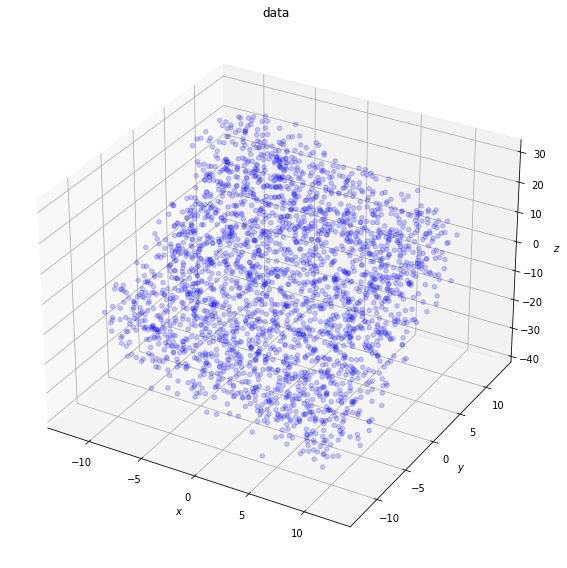

In [47]:
fig = plt.figure(figsize=(12, 8))

ax1 = plt.subplot(111, projection='3d')
plt.title('data')

ax1.set_xlabel('$x$')
ax1.set_ylabel('$y$')
ax1.set_zlabel('$z$')

ax1.scatter(xx, yy, zz, marker='o', color='blue', alpha=0.2)

plt.tight_layout()
plt.show()

## compute the loss function

In [48]:
def compute_residual(theta, x, y, z):

    num_data    = len(x)
    approx      = theta[0] + theta[1] * x + theta[2] * y
    residual    = approx - z

    return residual, num_data

In [49]:
def compute_loss(theta, x, y, z):

    (residual, num_data) = compute_residual(theta, x, y, z)
    loss = np.inner(residual, residual) / (2 * num_data)
    
    return loss

## compute the gradient for each model parameter

In [50]:
def compute_gradient(theta, x, y, z):

    (residual, num_data) = compute_residual(theta, x, y, z)
    A       = np.array((np.ones(num_data), x, y))
    grad    = np.matmul(A, residual) / num_data

    return grad

## gradient descent for each model parameter

In [51]:
num_iteration   = 1000
learning_rate   = 0.01

theta           = np.array((0, 0, 0))
theta_iteration = np.zeros((num_iteration, theta.size))
loss_iteration  = np.zeros(num_iteration)

for i in range(num_iteration):
    
    theta   = theta - learning_rate * compute_gradient(theta, xx, yy, zz)
    loss    = compute_loss(theta, xx, yy, zz)

    theta_iteration[i, :]   = theta
    loss_iteration[i]       = loss

    print("iteration = %4d, loss = %5.5f" % (i, loss))

9
iteration =  394, loss = 7.12305
iteration =  395, loss = 7.12302
iteration =  396, loss = 7.12299
iteration =  397, loss = 7.12296
iteration =  398, loss = 7.12293
iteration =  399, loss = 7.12290
iteration =  400, loss = 7.12287
iteration =  401, loss = 7.12284
iteration =  402, loss = 7.12282
iteration =  403, loss = 7.12279
iteration =  404, loss = 7.12276
iteration =  405, loss = 7.12273
iteration =  406, loss = 7.12271
iteration =  407, loss = 7.12268
iteration =  408, loss = 7.12266
iteration =  409, loss = 7.12264
iteration =  410, loss = 7.12261
iteration =  411, loss = 7.12259
iteration =  412, loss = 7.12257
iteration =  413, loss = 7.12254
iteration =  414, loss = 7.12252
iteration =  415, loss = 7.12250
iteration =  416, loss = 7.12248
iteration =  417, loss = 7.12246
iteration =  418, loss = 7.12244
iteration =  419, loss = 7.12242
iteration =  420, loss = 7.12240
iteration =  421, loss = 7.12238
iteration =  422, loss = 7.12236
iteration =  423, loss = 7.12234
iteratio

In [52]:
f = theta[0] + theta[1] * xx + theta[2] * yy

## plot the results

In [53]:
def plot_loss_curve(loss_iteration):

    plt.figure(figsize=(8,6))
    plt.title('loss')

    plt.plot(loss_iteration, '-', color='red')
    plt.xlabel('iteration')
    plt.ylabel('loss')

    plt.tight_layout()
    plt.show()

In [54]:
def plot_data(xx, yy, zz):
    
    fig = plt.figure(figsize=(12, 8))
    ax  = plt.subplot(111, projection='3d')
    
    plt.title('data')
    
    ax.set_xlabel('$x$')
    ax.set_ylabel('$y$')
    ax.set_zlabel('$z$')

    ax.scatter(xx, yy, zz, marker='o', color='blue', alpha=0.2)

    plt.tight_layout()
    plt.show()

In [55]:

def plot_model_parameter(theta_iteration):

    plt.figure(figsize=(8,6))
    plt.title('model parameter')

    plt.plot(theta_iteration[:, 0], '-', color='red', label=r'$\theta_0$')
    plt.plot(theta_iteration[:, 1], '-', color='green', label=r'$\theta_1$')
    plt.plot(theta_iteration[:, 2], '-', color='blue', label=r'$\theta_2$')
    
    plt.xlabel('iteration')
    plt.legend()

    plt.tight_layout()
    plt.show()

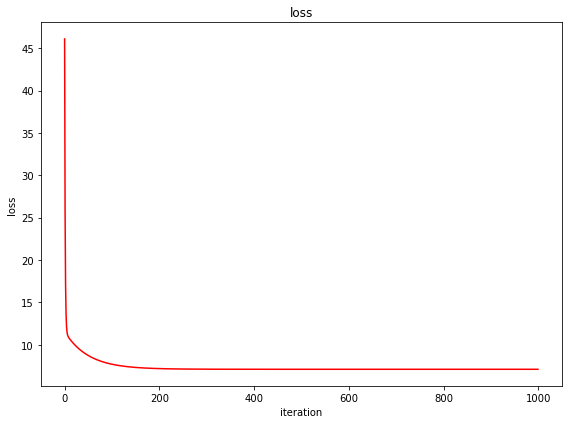

In [57]:
plot_loss_curve(loss_iteration)

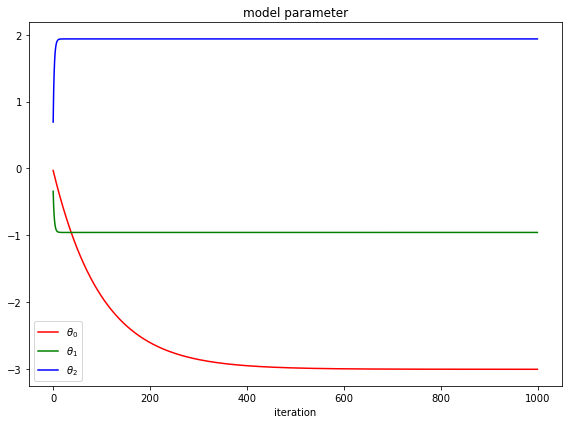

In [58]:
plot_model_parameter(theta_iteration)

In [59]:
X  = np.arange(-10, 10, 0.1)
Y  = np.arange(-10, 10, 0.1)

(XX, YY) = np.meshgrid(X, Y)
ZZ = theta[0] + theta[1] * XX + theta[2] * YY

def plot_surface(XX, YY, ZZ, xx, yy, zz):

    fig = plt.figure(figsize=(8,8))
    ax  = fig.add_subplot(111, projection='3d')
    plt.title('loss surface')

    ax  = plt.axes(projection='3d')

    ax.set_xlabel(r'$\theta_0$')
    ax.set_ylabel(r'$\theta_1$')
    ax.set_zlabel('loss')

    ax.plot_surface(XX, YY, ZZ, rstride=1, cstride=1, cmap='viridis', edgecolor='none', alpha=0.5)
    ax.scatter(xx, yy, zz, marker='o', color='blue', alpha=0.5)

    plt.tight_layout()
    plt.show()

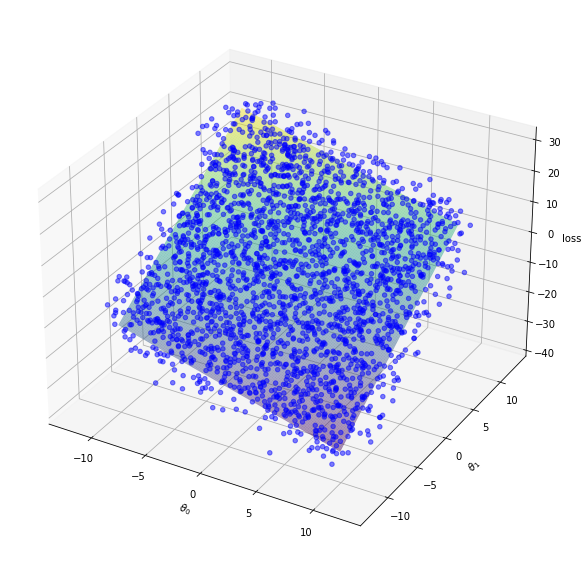

In [60]:
plot_surface(XX, YY, ZZ, xx, yy, zz)

# * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

# * results

# * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

### # 01. plot the input data in blue point in 3-dimensional space

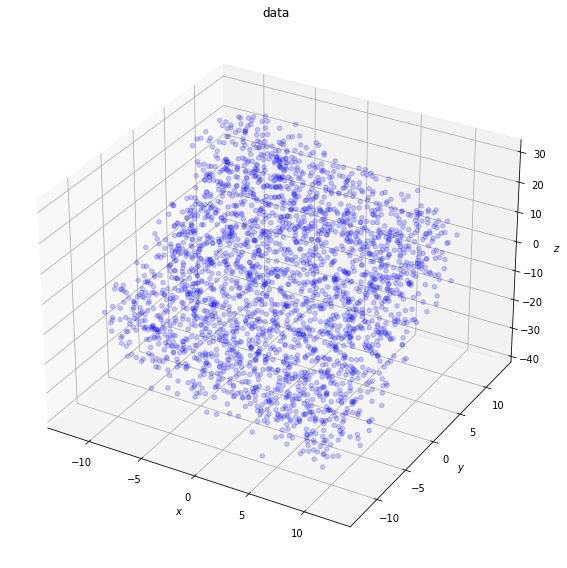

In [61]:
plot_data(xx, yy, zz)

### # 02. plot the values of the model parameters $\theta_0$ in red curve, $\theta_1$ in green curve, and $\theta_2$ in blue curve over the gradient descent iterations

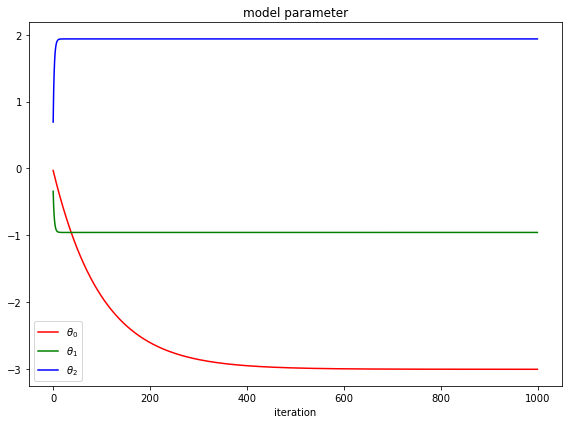

In [62]:
plot_model_parameter(theta_iteration)

### # 03. plot the loss values $\mathcal{L}(\theta)$ in red curve over the gradient descent iterations

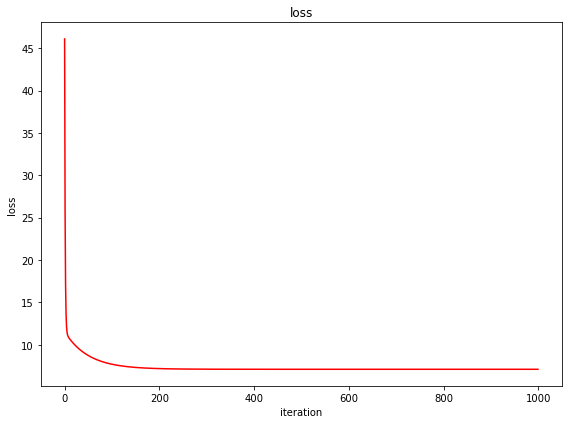

In [63]:
plot_loss_curve(loss_iteration)

### # 04. plot the optimal regression surface $\hat{f}(\theta^*)$ in 3-dimensional space with a given set of data points superimposed

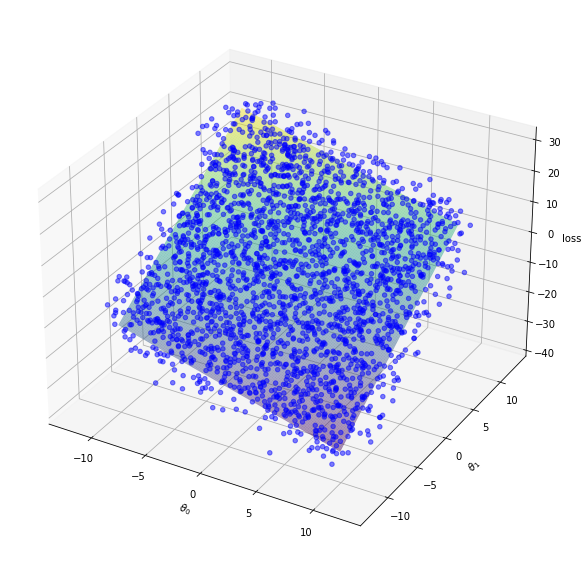

In [64]:
plot_surface(XX, YY, ZZ, xx, yy, zz)